# Deep Convolutional Generative Adversarial Network - Anime Faces

The simplies form of GAN model for generating anime faces. Expect this notebook experiments if using the LAB color space yields better result.

In [1]:
%pip install -q imageio pydot tensorflow-gpu==2.9.3 keras matplotlib graphviz moviepy

Note: you may need to restart the kernel to use updated packages.


## Import all Modules

In [2]:
#os.environ["CUDA_VISIBLE_DEVICES"]="-1"  # Debug only
from IPython import display
import time
from IPython.display import Image
import os
from numpy import asarray
import numpy as np
import matplotlib.pyplot as plt
import pathlib
import os.path
import imageio
import math
import glob
import PIL
import PIL.Image
import tensorflow as tf
from keras import layers, backend
from skimage.color import lab2rgb
import keras
from tensorflow.keras import mixed_precision
import tensorflow_io as tfio

# initialize tf.distribute.MirroredStrategy
strategy = tf.distribute.MirroredStrategy(devices=None)
print('Number of devices: {}'.format(strategy.num_replicas_in_sync))

INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')
Number of devices: 2


2023-03-28 12:27:17.369354: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:975] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2023-03-28 12:27:17.369573: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:975] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2023-03-28 12:27:17.388140: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:975] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2023-03-28 12:27:17.388391: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:975] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2023-03-28 12:27:17.388594: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:975] successful NUMA node read from S

In [3]:
tf.__version__

'2.9.3'

### Configure Output Directory
Set the output directory where all the results will be storaged.

In [4]:
root_dir = "result/anime_gan_lab_color_space"
if not os.path.exists(root_dir):
    os.mkdir(root_dir)

## Load and process data.
Will take advantage of built in tensorflow/keras for asynchronous load dataset from disk, rather force all data to be loaded in memory.

In [5]:
def load_from_directory(data_dir, image_size, batch_size):
    def configure_for_performance(ds, AUTOTUNE):
        #ds = ds.cache(filename='/tmp/StylizedGANLab', name='StylizedGANLab')
        ds = ds.prefetch(buffer_size=AUTOTUNE)
        return ds

    # Search and find number of elements within directory, recursively.
    image_count = len(list(data_dir.glob('**/*.??g')))
    print("{0}: Found {1} files".format(data_dir, image_count))

    #
    train_ds = tf.keras.utils.image_dataset_from_directory(
        data_dir,
        interpolation='bilinear',
        color_mode='rgb',
        label_mode=None,
        follow_links=True,
        shuffle=True,
        image_size=image_size,
        batch_size=batch_size)

    #
    AUTOTUNE = tf.data.AUTOTUNE
    normalization_layer = tf.keras.layers.Rescaling(1.0 / 255.0)

    @tf.function
    def preprocess_lab(img):
        image = tf.cast(img, tf.float32)
        return tfio.experimental.color.rgb_to_lab(image)
        
    # Translate [0,255] -> [-1, 1]
    normalized_train_ds = (train_ds.map(lambda x: preprocess_lab(normalization_layer(x)) * (1.0 / 128.0)))

    return configure_for_performance(normalized_train_ds, AUTOTUNE=AUTOTUNE)


In [6]:

latent_space_size = [64, 96, 128, 168, 192]

BATCH_SIZE_PER_REPLICA = 96
BATCH_SIZE = 96 #BATCH_SIZE_PER_REPLICA * strategy.num_replicas_in_sync

IMAGE_SIZE = (128, 128)
EPOCHS = 32

data_directory_path = "data-gan/"
data_dir = pathlib.Path(data_directory_path)

train_images = load_from_directory(data_dir, IMAGE_SIZE, BATCH_SIZE)

print("Number of batches {0} of {1} elements".format(
    len(train_images), BATCH_SIZE))

# Setup to support multiple GPUs
options = tf.data.Options()
options.experimental_distribute.auto_shard_policy = tf.data.experimental.AutoShardPolicy.DATA
train_images = train_images.with_options(options)


data-gan: Found 92108 files
Found 92108 files belonging to 1 classes.
Number of batches 960 of 96 elements


## Create the models

Both the generator and discriminator are defined using the [Keras Sequential API](https://www.tensorflow.org/guide/keras#sequential_model).

### The Generator

The generator uses `tf.keras.layers.Conv2DTranspose` (upsampling) layers to produce an image from a seed (random noise). Start with a `Dense` layer that takes this seed as input, then upsample several times until you reach the desired image size.

In [7]:
def make_generator_model(input_shape):
    model = tf.keras.Sequential()

    init = tf.keras.initializers.TruncatedNormal(stddev=0.02)

    n2 = math.log2(float(IMAGE_SIZE[0]))
    num_layers = max(int(n2) - 4, 0)

    # Foundation for 4x4 image
    n_nodes = 1024 * 4 * 4
    model.add(layers.Dense(
        n_nodes, kernel_initializer=init, input_dim=input_shape))
    model.add(layers.BatchNormalization())
    model.add(layers.ReLU())

    model.add(layers.Reshape((4, 4, 1024)))
    # Note: None is the batch size
    assert model.output_shape == (None, 4, 4, 1024)

    # upsample to 8x8
    model.add(layers.Conv2DTranspose(filters=1024, kernel_size=(4, 4), strides=(2, 2),
                                     use_bias=False, padding='same', kernel_initializer=init))
    model.add(layers.BatchNormalization())
    model.add(layers.ReLU())

    # Number of based on the result resolution.
    for i in range(0, num_layers + 1):
        filter_size = int(512 / (2 ** i))
        image_size = (16 * (2 ** i), 16 * (2 ** i))

        model.add(layers.Conv2DTranspose(filters=filter_size, kernel_size=(4, 4), strides=(2, 2), use_bias=False, padding='same',
                                         kernel_initializer=init))
        model.add(layers.BatchNormalization())
        model.add(layers.ReLU())
        assert model.output_shape == (
            None, image_size[0], image_size[1], filter_size)

    # output layer
    model.add(layers.Conv2DTranspose(filters=3, kernel_size=(4, 4), strides=(
        1, 1), padding='same', kernel_initializer=init))
    model.add(layers.Activation('tanh'))

    assert model.output_shape == (None, IMAGE_SIZE[0], IMAGE_SIZE[1], 3)

    return model

Use the (as yet untrained) generator to create an image.

2023-03-28 12:27:29.793196: I tensorflow/stream_executor/cuda/cuda_blas.cc:1786] TensorFloat-32 will be used for the matrix multiplication. This will only be logged once.
2023-03-28 12:27:29.883419: I tensorflow/stream_executor/cuda/cuda_dnn.cc:384] Loaded cuDNN version 8500


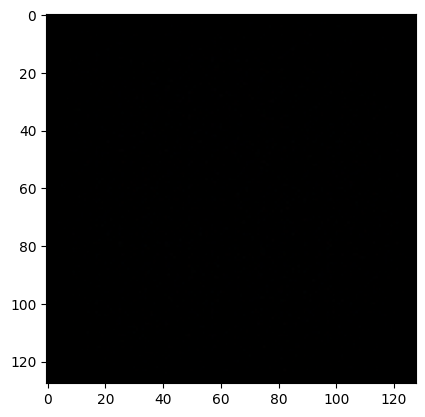

In [8]:

latent_space_tmp = (latent_space_size[0])
generator = make_generator_model(latent_space_tmp)

tmp_noise = tf.random.normal([1, latent_space_tmp])
generated_image = generator(tmp_noise, training=False)

# Convert image from [-1,1] to [0,1]
plt.imshow(lab2rgb(generated_image[0, :, :, :] * 128))
plt.show()


### The Discriminator

The discriminator is a CNN-based image classifier.

In [9]:
def make_discriminator_model():
    model = tf.keras.Sequential()

    n_layers = max(int(math.log2(IMAGE_SIZE[1])) - 3, 0)

    model.add(layers.Conv2D(filters=64, kernel_size=(3, 3), strides=(2, 2), use_bias=False, padding='same',
                            input_shape=[IMAGE_SIZE[0], IMAGE_SIZE[1], 3]))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU(alpha=0.2))

    for i in range(0, n_layers):
        filter_size = 128 * (2 ** i)
        kernel_size = (5, 5)
        model.add(layers.Conv2D(filter_size, kernel_size=kernel_size,
                                strides=(2, 2), use_bias=False, padding='same'))
        model.add(layers.BatchNormalization())
        model.add(layers.LeakyReLU(alpha=0.2))

    model.add(layers.Conv2D(1, kernel_size=4, strides=(
        2, 2), padding='valid', use_bias=False))
    model.add(layers.Flatten())
    model.add(layers.Activation('sigmoid'))

    return model


## Common Methods

In [11]:
def generate_grid_image(model, latent_space, figsize=(8, 8), subplotsize=(3, 3)):
    # Notice `training` is set to False.
    # This is so all layers run in inference mode (batchnorm).
    predictions = model(latent_space, training=False)

    fig = plt.figure(figsize=figsize)
    for i in range(predictions.shape[0]):
        plt.subplot(subplotsize[0], subplotsize[1], i + 1)
        lab = predictions[i, :, :, :] * 128

        plt.imshow(lab2rgb(lab))
        plt.axis('off')
    plt.close()
    return fig


def generate_and_save_images(model, epoch, latent_space):
    fig = generate_grid_image(model=model, latent_space=latent_space)
    fig.savefig(os.path.join(root_dir, 'L{0}_image_at_epoch_{1}.png'.format(len(latent_space) , epoch)), transparent=False)
    plt.show()


In [26]:
# Generate a big image.
def generateBigBridImage(model, grid_size, latent_space_size=latent_space_size):
    width, height = grid_size

    latent_space = tf.random.normal([width * height, latent_space_size])

    generated_images = model(latent_space, training=False)

    fig = plt.figure(figsize=(width * 2, height * 2))
    for i in range(generated_images.shape[0]):
        plt.subplot(height, width, i+1,)

        generated_image_rb = lab2rgb(generated_images[i, :, :, :] * 128)

        plt.imshow(generated_image_rb, aspect='auto')
        plt.axis("off")
    plt.subplots_adjust(wspace=0, hspace=0)
    return fig


In [13]:
def plotCostHistory(history, loss_label="", val_label="", title="", x_label="", y_label=""):
    for k, v in history.items():
        plt.plot(v, label=k)
    plt.title(label=title)
    plt.ylabel(ylabel=y_label)
    plt.xlabel(xlabel=x_label)
    plt.legend(loc="upper left")
    plt.show(block=False)


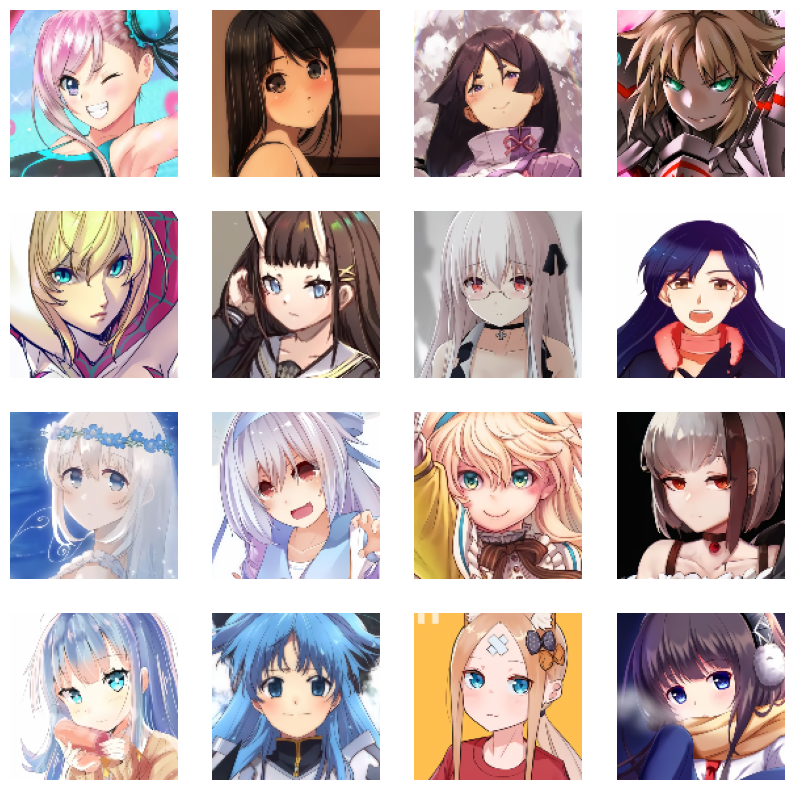

In [14]:
num_examples_to_generate = 9

# We will reuse this seed overtime (so it's easier)
# to visualize progress in the animated GIF.
seed = tf.random.normal([num_examples_to_generate, latent_space_size[0]])

plt.figure(figsize=(10, 10))

train_batch_iter = iter(train_images)
train_image_batch = next(train_batch_iter)

for images in train_images.take(1):
    for i in range(4*4):
        ax = plt.subplot(4, 4, i + 1)
        # Transform pixel values from [-1,1] to [0,1]
        plt.imshow((lab2rgb(train_image_batch[i] * 128)))
        plt.axis("off")
    if len(train_image_batch) - 1 == i:
        train_image_batch = next(train_batch_iter)
plt.show()


In [15]:

class DCGAN(keras.Model):

    def __init__(self, generator_model, discriminator_model, **kwargs):

        super(DCGAN, self).__init__(**kwargs)
        self.generator = generator_model
        self.discriminator = discriminator_model
        self.latent_space_size = generator_model.input_shape[1]

        self.cross_entropy = tf.keras.losses.BinaryCrossentropy(
            from_logits=False)

    def generator_loss(self, fake_output):

        return self.cross_entropy(tf.ones_like(fake_output), fake_output)

    def discriminator_loss(self, real_output, fake_output, smooth=0.11):

        # label for real image is (1-smooth)
        real_loss = self.cross_entropy(tf.ones_like(
            real_output)*(1-smooth), real_output)
        fake_loss = self.cross_entropy(tf.zeros_like(fake_output), fake_output)
        total_loss = real_loss + fake_loss

        return total_loss

    def compile(self, generator_optimizer, discriminator_optimizer):
        super(DCGAN, self).compile()
        self.generator_optimizer = generator_optimizer
        self.discriminator_optimizer = discriminator_optimizer

    @tf.function
    def train_step(self, data):

        batch_size = tf.shape(data)[0]
        
        # feed a random input to generator
        seed = tf.random.normal(shape=(batch_size, self.latent_space_size))

        with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:

            # generate image using generator
            generated_image = self.generator(seed, training=True)

            # discriminator's prediction for real image
            real_output = self.discriminator(data, training=True)

            # discriminator's estimate for fake image
            fake_output = self.discriminator(
                generated_image, training=True)

            # compute loss
            gen_loss = self.generator_loss(fake_output)
            disc_loss = self.discriminator_loss(real_output, fake_output)

            # optimize generator first
            generator_grad = gen_tape.gradient(
                gen_loss, self.generator.trainable_variables)
            discriminator_grad = disc_tape.gradient(
                disc_loss, self.discriminator.trainable_variables)

            # optimize discriminator after generator
            self.generator_optimizer.apply_gradients(
                zip(generator_grad, self.generator.trainable_variables))
            self.discriminator_optimizer.apply_gradients(
                zip(discriminator_grad, self.discriminator.trainable_variables))

        return {
            "generator loss": gen_loss,
            "discriminator_loss": disc_loss
        }


In [16]:
class checkpoint_callback(tf.keras.callbacks.Callback):

    def __init__(self, generator_path, weight_path, **kwargs):
        super(tf.keras.callbacks.Callback, self).__init__(**kwargs)
        self.generator_path = generator_path
        self.weight_path = weight_path

    def on_epoch_end(self, epoch, logs=None):
        if not os.path.exists(self.weight_path):
            os.mkdir(self.weight_path)

        self.model.generator.save_weights(os.path.join(self.weight_path, "L{0}_generator_weights.h5".format(epoch)))
        self.model.discriminator.save_weights(os.path.join(self.weight_path,
                                                           "L{0}_discriminator_weights.h5".format(epoch)))

        self.model.generator.save(self.generator_path)

class save_images(tf.keras.callbacks.Callback):

    def __init__(self, noise, in_latent_space, **kwargs):
        super(tf.keras.callbacks.Callback, self).__init__(**kwargs)
        self.noise = noise
        self.latent_space_size = in_latent_space

    def on_epoch_end(self, epoch, logs=None):
        generate_and_save_images(self.model.generator, epoch, self.noise)

        grid_size = (16, 9)
        big_fig = generateBigBridImage(self.model.generator, grid_size, self.latent_space_size)
        big_fig.savefig(os.path.join(root_dir, 'L{0}_big_image_at_epoch_{1}.png'.format(
            self.latent_space_size, epoch + 1)), transparent=None)
        plt.close()


In [ ]:

dcgan_result = []
dcgan_history = []

for latent_space in latent_space_size:

	generator_model = make_generator_model((latent_space))
	generator_model_filepath = os.path.join(root_dir, str.format("dcgan-anime-generator_L{0}.h5", latent_space))

	generator_optimizer = tf.keras.optimizers.Adam(
		learning_rate=0.0002, beta_1=0.5)
	discriminator_optimizer = tf.keras.optimizers.Adam(
		learning_rate=0.0002, beta_1=0.5)

	fixed_latent_space_noise = tf.random.normal(
		[num_examples_to_generate, latent_space])

	dcgan = DCGAN(generator_model, make_discriminator_model())
	dcgan.compile(generator_optimizer, discriminator_optimizer)
	history = dcgan.fit(train_images, epochs=EPOCHS, batch_size=BATCH_SIZE,
						callbacks=[
							save_images(noise=fixed_latent_space_noise, in_latent_space=latent_space),
							checkpoint_callback(generator_path=generator_model_filepath, weight_path=os.path.join(
								root_dir, str.format("Weights_L{0}", latent_space)))
						]
						)
	dcgan_result.append(dcgan)
	dcgan_history.append(history)


# History Result

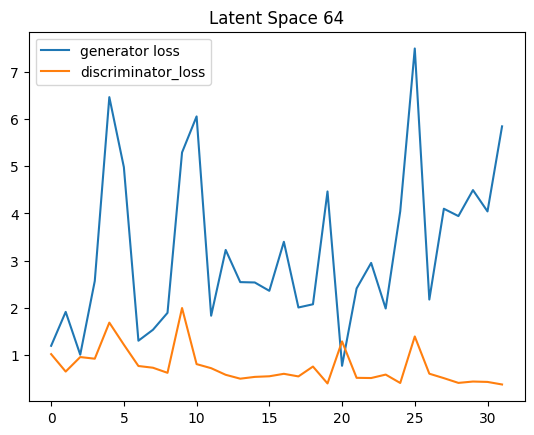

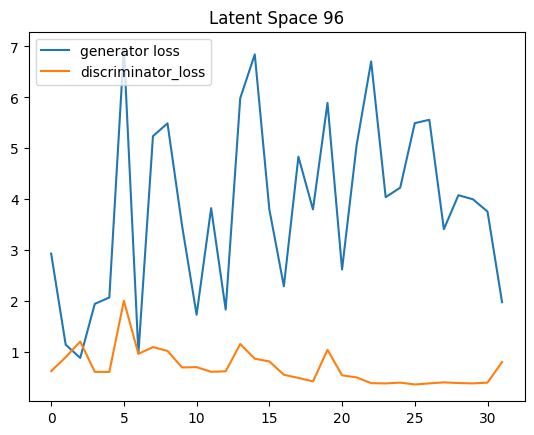

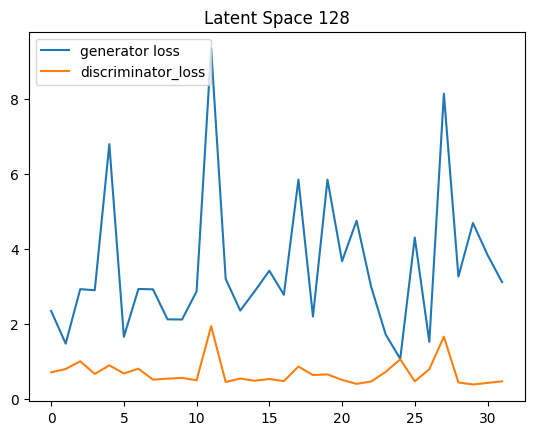

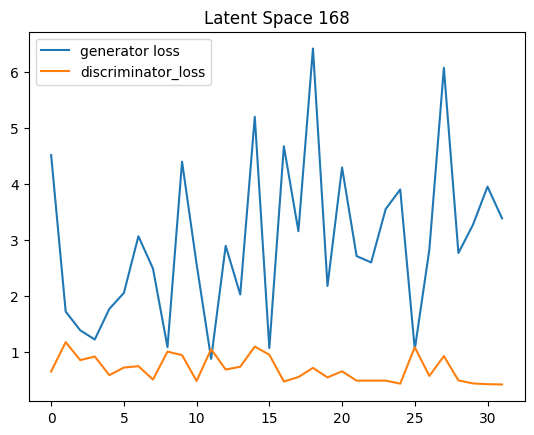

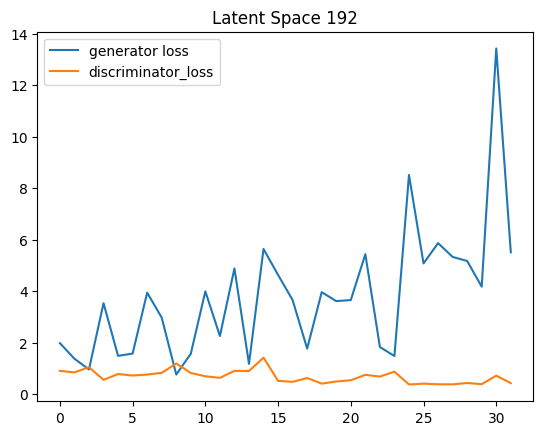

In [18]:
for i, gan_history in enumerate(dcgan_history):
    plotCostHistory(gan_history.history, title="Latent Space {0}".format(latent_space_size[i]))


# Final Generator Image Result

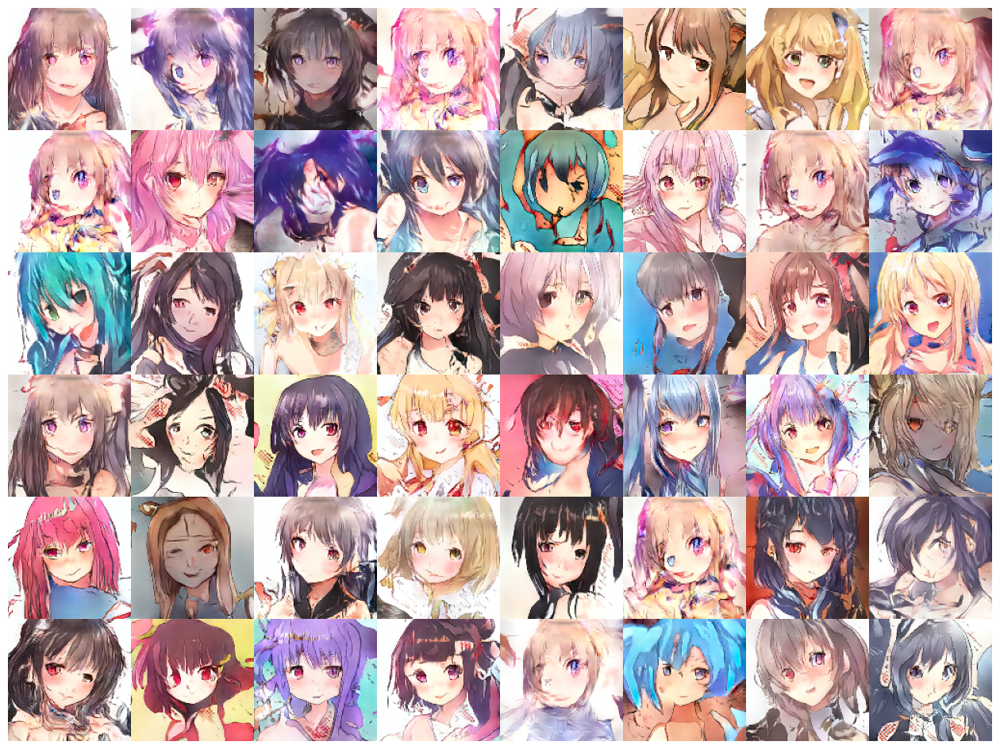

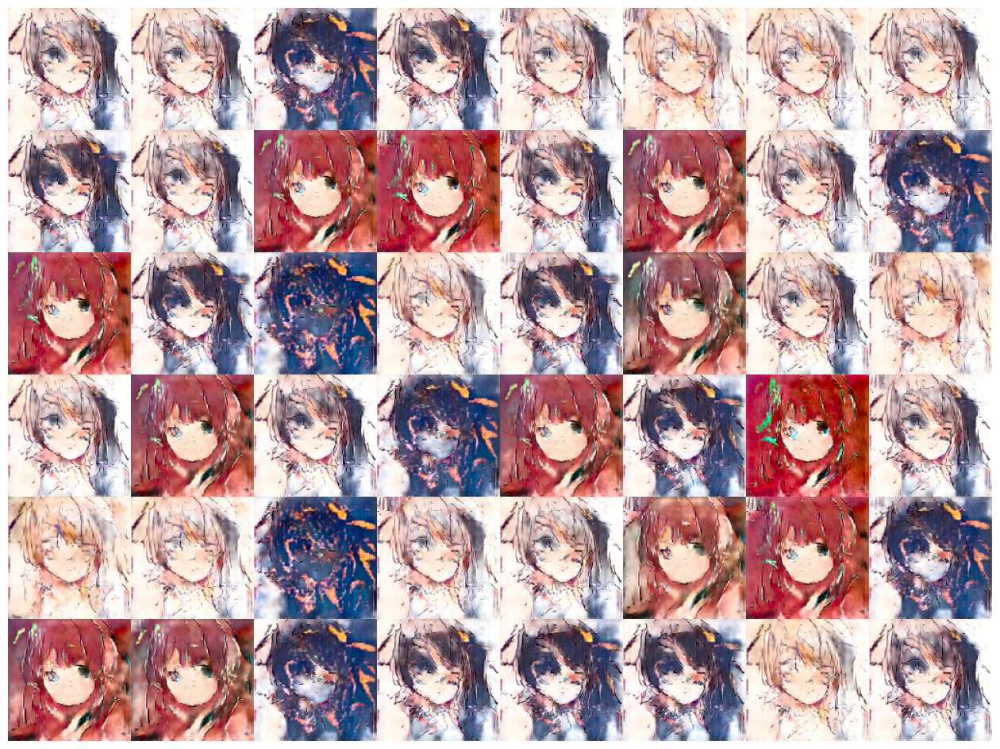

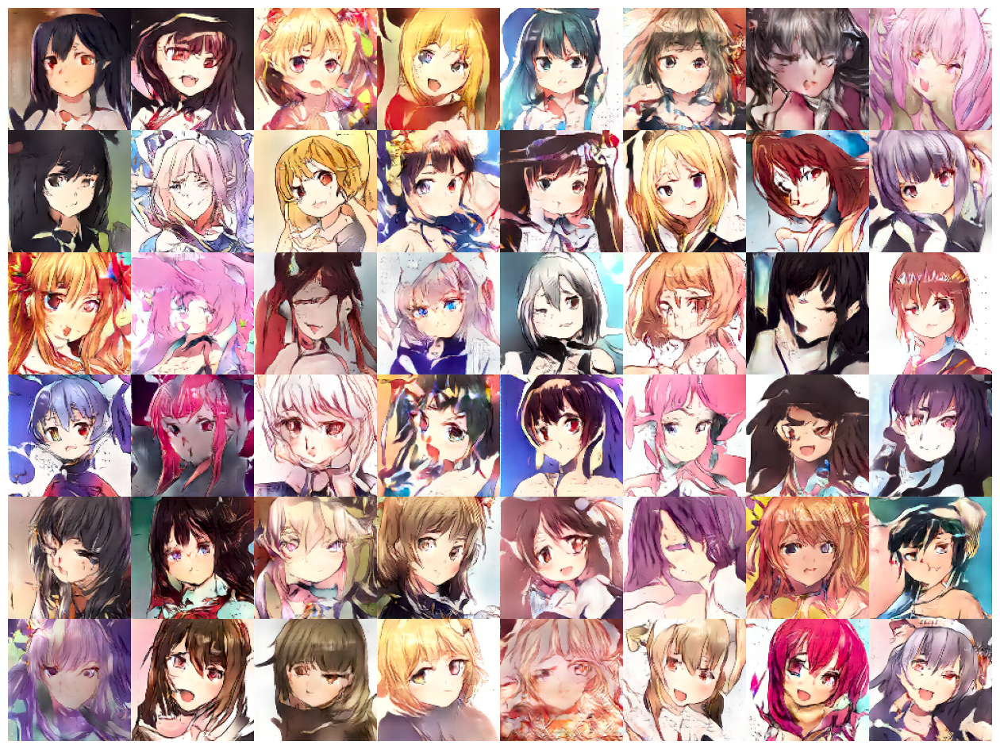

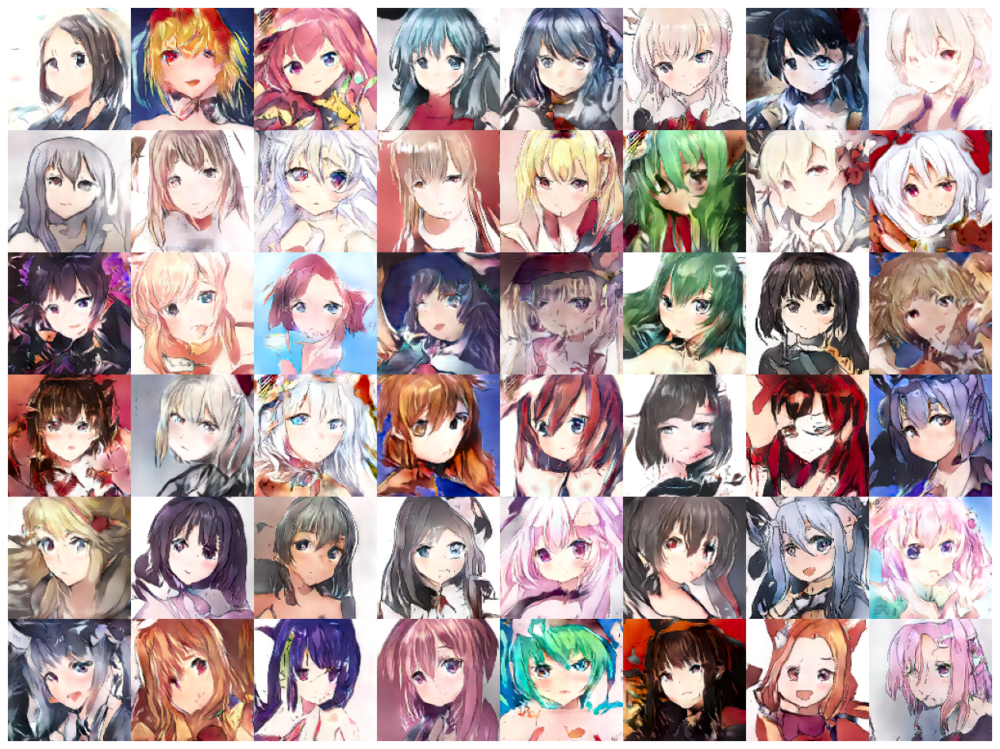

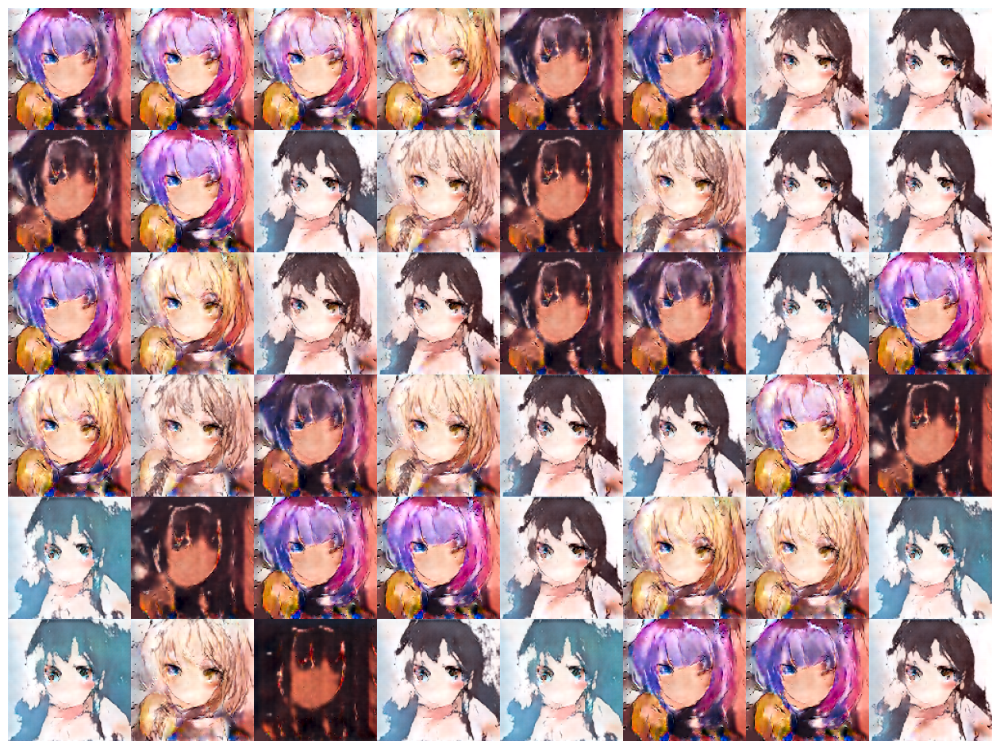

In [28]:
# Display a single image using the epoch number
for i, dcgan_model in enumerate(dcgan_result):
    big_fig = generateBigBridImage(dcgan_model.generator, (8, 6), latent_space_size[i])
plt.show()

## Create a GIF


Use `imageio` to create an animated gif using the images saved during training.

In [20]:
anim_file = os.path.join(root_dir, 'anime-dcgan.gif')

with imageio.get_writer(anim_file, mode='I') as writer:
    filenames = glob.glob(os.path.join(root_dir, 'image*.png'))
    filenames = sorted(filenames)
    for filename in filenames:
        image = imageio.imread(filename)
        writer.append_data(image)
    image = imageio.imread(filename)
    writer.append_data(image)


Image(url=anim_file)

/tmp/ipykernel_3701/871862930.py:7: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning dissapear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  image = imageio.imread(filename)
/tmp/ipykernel_3701/871862930.py:9: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning dissapear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  image = imageio.imread(filename)


## Generate Transition Image

By adjusting between two points within the latent space and interpolated of number of frames.

In [21]:
def interpolate(zs, steps):
    out = []
    for i in range(len(zs)-1):
        for index in range(steps):
            fraction = index/float(steps)
            out.append(zs[i+1]*fraction + zs[i]*(1-fraction))
    return out


In [22]:
import scipy
import moviepy.editor


In [23]:

fps = 15
duration_sec = 5
smoothing_sec = 1.0
num_frames = 4 * fps

shape = [num_frames, np.prod(latent_space_size)]

nr_elemenets = 9

seeds = np.random.randint(10000, size=2)

gif_filepaths = []
for i, dcgan_model in enumerate(dcgan_result):
    def make_frame(t):
        frame_idx = int(np.clip(np.round(t * fps), 0, num_frames - 1))
        latents = all_latents[frame_idx]

        #
        fig = generate_grid_image(dcgan_model.generator, latents, (5, 5), (3, 3))

        #
        fig.canvas.draw()
        data = np.frombuffer(fig.canvas.tostring_rgb(), dtype=np.uint8)
        data = data.reshape(fig.canvas.get_width_height()[::-1] + (3,))

        return data

    zs = [tf.random.normal([nr_elemenets, latent_space_size[i]], seed=s)
          for s in seeds]

    all_latents = interpolate(zs, num_frames)

    gif_filepath = os.path.join(root_dir, ('L{0}_transition_grid_{1}.gif'.format(latent_space_size[i], seeds[0])))
    video_clip = moviepy.editor.VideoClip(make_frame, duration=duration_sec)
    video_clip.write_gif(gif_filepath, fps=fps)

    gif_filepaths.append(gif_filepath)


MoviePy - Building file result/anime_gan_lab_color_space/L64_transition_grid_2388.gif with imageio.


MoviePy - Building file result/anime_gan_lab_color_space/L96_transition_grid_2388.gif with imageio.


MoviePy - Building file result/anime_gan_lab_color_space/L128_transition_grid_2388.gif with imageio.


MoviePy - Building file result/anime_gan_lab_color_space/L168_transition_grid_2388.gif with imageio.


MoviePy - Building file result/anime_gan_lab_color_space/L192_transition_grid_2388.gif with imageio.


In [24]:
for gif_filepath in gif_filepaths:
    Image(url=gif_filepath)
